In [ ]:


# This code is included as supplementary material for the paper:
# "Tilting the playing field: Dynamical loss functions for machine learning"
# We share it in a Colab notebook because it should be straightfoward to run.
# Please, be aware this code is not optimized and its only purpose is to show the phenomenology 
# discussed in the paper. This code reproduces Fig. 4 in our paper.


!pip install -q git+https://www.github.com/google/neural-tangents

import matplotlib
import numpy as np
import matplotlib.pyplot as plt
import sys
import time
from matplotlib import gridspec
import pickle
import sys
from collections import namedtuple
import os

from jax import grad, jit
from jax.tree_util import tree_multimap

import neural_tangents as nt
from neural_tangents import stax

import jax
import jax.numpy as jnp
from jax import random
from jax.config import config
config.update("jax_enable_x64", True)

import numpy.random as npr
import seaborn as sns

In [ ]:

# To compute the eigenvalues of the Hessian using the Lanczos algorithm we use
# this code by Justin Gilmer (https://github.com/google/spectral-density)

!git clone https://github.com/google/spectral-density.git

!cp /content/spectral-density/jax/density.py /content/
!cp /content/spectral-density/jax/hessian_computation.py /content/
!cp /content/spectral-density/jax/lanczos.py /content/

import hessian_computation as hessian_computation
import lanczos as lanczos
import density as density_lib

fatal: destination path 'spectral-density' already exists and is not an empty directory.


In [ ]:

### GLOBAL VARIABLES FOR THE SIMULATION ###

N = 100           #number of points per class
C = 3             #number of classes
NN_width = 100    #width of the NN
learning_rate = 1


## Shorter simulation, only two first cycles (faster to run) ##
# T = 5000                      # time steps for one period
# total_time = 10000            # total simulation time
# last_period_no_osc = 0        # make A=1 for the last oscillation?

## Uncomment the following lines for the same simulation as in Fig. 4 (approx. 1 hour to run) ## 
T = 5000                      # time steps for one period
total_time = 70000            # total simulation time
last_period_no_osc = 1        # make A=1 for the last oscillation?


start_osc_from_the_middle = 0
time_comp_density = 25           # time step to compute Hessian eigenvalues 
order = 10                       # order of the Lanczos method

In [ ]:


# Function to plot the results

def plot_all_together_5(density, grids, NTK_EVALS, W, L, L_weighted, A, eigv_list, eigv_plot_times,  limx_2_t = 100000,limx_1 = 8500, limx_2 = 10500):

    # defining some parameters
    markersize_t = 12
    number_eig = 1
    limy_w = 0.25
    limx_1_t = 0
    tick1 = 20
    tick2 = 5
    size_fig = 40
    poslet1 = 30
    poslet2 = 320
    fontsize = 60
    sns.set(context='talk', font_scale=3.5,  color_codes=True, palette='deep', style='ticks', 
            rc={"font.size":fontsize,"axes.titlesize":fontsize,"axes.labelsize":fontsize, 'mathtext.fontset': 'cm', 'xtick.direction': 'in','ytick.direction': 'in', 'axes.linewidth': 5.0})
    xlab = lambda name: plt.xlabel(name, fontsize=fontsize)
    ylab = lambda name: plt.ylabel(name, fontsize=fontsize)


    max_eval = [l[-1] for l in NTK_EVALS]
    times = np.array(eigv_plot_times)
    
    fig5 = plt.figure(figsize=(60,size_fig),constrained_layout=True)
    spec5 = fig5.add_gridspec(ncols=2, nrows=6, width_ratios=[6,1])


    ax = fig5.add_subplot(spec5[0, 0])
    W = np.array(W)
    colors_w = [np.array([176/256, 27/256, 42/256, 1]),'gold', 'darkblue']
    for ccc in range(3): 
        plt.plot(W[:,ccc],'.',c=colors_w[ccc],markersize=markersize_t)
    plt.xlim((limx_1_t,limx_2_t))
    ax.set_xticklabels([])
    plt.tick_params(which = 'both', direction='in', length=tick1, width=tick2)
    ylab('$\Gamma_i$')
    
    
    ax = fig5.add_subplot(spec5[0, 1])
    W = np.array(W)
    colors_w = [np.array([176/256, 27/256, 42/256, 1]),'gold', 'darkblue']
    for ccc in range(3): 
        plt.plot(W[:,ccc],'.',c=colors_w[ccc],markersize=markersize_t)
    plt.xlim((limx_1,limx_2))
    plt.tick_params(which = 'both', direction='in', length=tick1, width=tick2)
    ax.set_xticklabels([])

    ax = fig5.add_subplot(spec5[1, 0])
    plt.semilogy(L_weighted,'.' , markersize=markersize_t)
    plt.xlim((limx_1_t,limx_2_t))
    plt.tick_params(which = 'both', direction='in', length=tick1, width=tick2)
    ax.set_xticklabels([])
    ylab('$\mathcal{F}$')
    
    
    ax = fig5.add_subplot(spec5[1, 1])
    plt.plot(L_weighted,'.' , markersize=markersize_t)
    plt.ylim((0.2,0.6))
    plt.xlim((limx_1,limx_2))
    plt.tick_params(which = 'both', direction='in', length=tick1, width=tick2)
    ax.set_xticklabels([])
    
    
    ax = fig5.add_subplot(spec5[2, 0])
    plt.plot(np.array(L_weighted[:-1]) - np.array(L_weighted[1:]),'.' , markersize=markersize_t)
    plt.ylim((-limy_w,limy_w))
    plt.xlim((limx_1_t,limx_2_t))
    ax.set_xticklabels([])
    plt.tick_params(direction='in', length=tick1, width=tick2)
    ylab('$\mathcal{F}(t) - \mathcal{F}(t - 1)$')
    
    
    ax = fig5.add_subplot(spec5[2, 1])
    plt.plot(np.array(L_weighted[:-1]) - np.array(L_weighted[1:]),'.' , markersize=markersize_t)
    plt.ylim((-0.15,0.15))
    plt.xlim((limx_1,limx_2))
    plt.tick_params(direction='in', length=tick1, width=tick2)
    ax.set_xticklabels([])
  

    ax = fig5.add_subplot(spec5[3, 0])
    plt.plot(A,'.' , markersize=markersize_t)
    plt.xlim((limx_1_t,limx_2_t))
    ax.set_xticklabels([])
    plt.tick_params(direction='in', length=tick1, width=tick2)
    ylab('$Accuracy$') 
    
    ax = fig5.add_subplot(spec5[3, 1])
    plt.plot(A,'.' , markersize=markersize_t)
    plt.ylim((0.2,0.6))
    plt.xlim((limx_1,limx_2))
    ax.set_xticklabels([])
    plt.tick_params(direction='in', length=tick1, width=tick2)
    
    ax = fig5.add_subplot(spec5[4, 0])
    for iii in range(number_eig):
        plt.semilogy(eigv_plot_times,eigv_list[:,iii],'.', markersize=markersize_t)
    plt.xlim((limx_1_t,limx_2_t))
    ax.set_xticklabels([])
    plt.tick_params( direction='in', length=tick1, width=tick2)
    plt.tick_params(which = 'minor', direction='in', length=tick1/2, width=tick2/2)
    ylab('$Hessian \ \\lambda_{max}$')    
    
    ax = fig5.add_subplot(spec5[4, 1])
    for iii in range(number_eig):
        plt.semilogy(eigv_plot_times,eigv_list[:,iii],'.', markersize=markersize_t)
    plt.xlim((limx_1,limx_2))
    ax.set_xticklabels([])
    plt.tick_params(direction='in', length=tick1, width=tick2)  

    ax = fig5.add_subplot(spec5[5, 0])
    plt.plot(max_eval,'.' , markersize=markersize_t)    
    plt.xlim((limx_1_t,limx_2_t))
    plt.tick_params(direction='in', length=tick1, width=tick2)
    ylab('$NTK \ \\lambda_{max}$')
    xlab('$t$')
    

    ax = fig5.add_subplot(spec5[5, 1])
    plt.plot(max_eval,'.' , markersize=markersize_t)    
    plt.xlim((limx_1,limx_2))
    plt.tick_params(direction='in', length=tick1, width=tick2)
    plt.ylim((0,1000))
    xlab('$t$')

    plt.show()
    

num_train,num_complete_batches, leftover,num_batches,bool(leftover) 300 1 0 1 False
batch_size 300

  NEW SIMULATION A:  70 
 

 time:  0

 time:  25

 time:  50

 time:  75

 time:  100

 time:  125

 time:  150

 time:  175

 time:  200

 time:  225

 time:  250

 time:  275

 time:  300

 time:  325

 time:  350

 time:  375

 time:  400

 time:  425

 time:  450

 time:  475

 time:  500

 time:  525

 time:  550

 time:  575

 time:  600

 time:  625

 time:  650

 time:  675

 time:  700

 time:  725

 time:  750

 time:  775

 time:  800

 time:  825

 time:  850

 time:  875

 time:  900

 time:  925

 time:  950

 time:  975

 time:  1000

 time:  1025

 time:  1050

 time:  1075

 time:  1100

 time:  1125

 time:  1150

 time:  1175

 time:  1200

 time:  1225

 time:  1250

 time:  1275

 time:  1300

 time:  1325

 time:  1350

 time:  1375

 time:  1400

 time:  1425

 time:  1450

 time:  1475

 time:  1500

 time:  1525

 time:  1550

 time:  1575

 time:  1600

 time: 

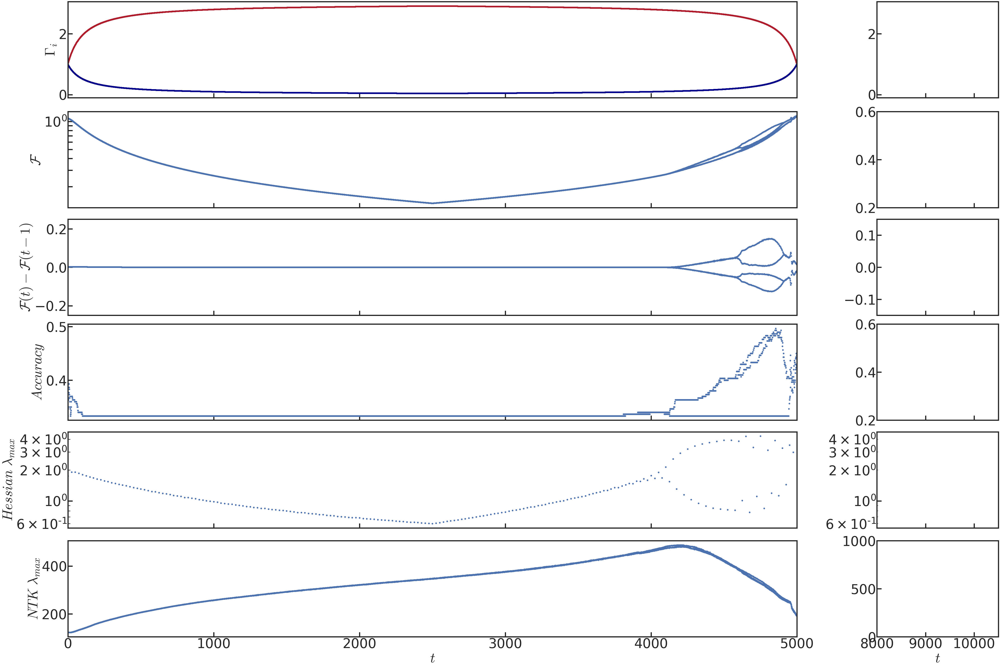


 time:  5000

 time:  5025

 time:  5050

 time:  5075

 time:  5100

 time:  5125

 time:  5150

 time:  5175

 time:  5200

 time:  5225

 time:  5250

 time:  5275

 time:  5300

 time:  5325

 time:  5350

 time:  5375

 time:  5400

 time:  5425

 time:  5450

 time:  5475

 time:  5500

 time:  5525

 time:  5550

 time:  5575

 time:  5600

 time:  5625

 time:  5650

 time:  5675

 time:  5700

 time:  5725

 time:  5750

 time:  5775

 time:  5800

 time:  5825

 time:  5850

 time:  5875

 time:  5900

 time:  5925

 time:  5950

 time:  5975

 time:  6000

 time:  6025

 time:  6050

 time:  6075

 time:  6100

 time:  6125

 time:  6150

 time:  6175

 time:  6200

 time:  6225

 time:  6250

 time:  6275

 time:  6300

 time:  6325

 time:  6350

 time:  6375

 time:  6400

 time:  6425

 time:  6450

 time:  6475

 time:  6500

 time:  6525

 time:  6550

 time:  6575

 time:  6600

 time:  6625

 time:  6650

 time:  6675

 time:  6700

 time:  6725

 time:  6750

 time

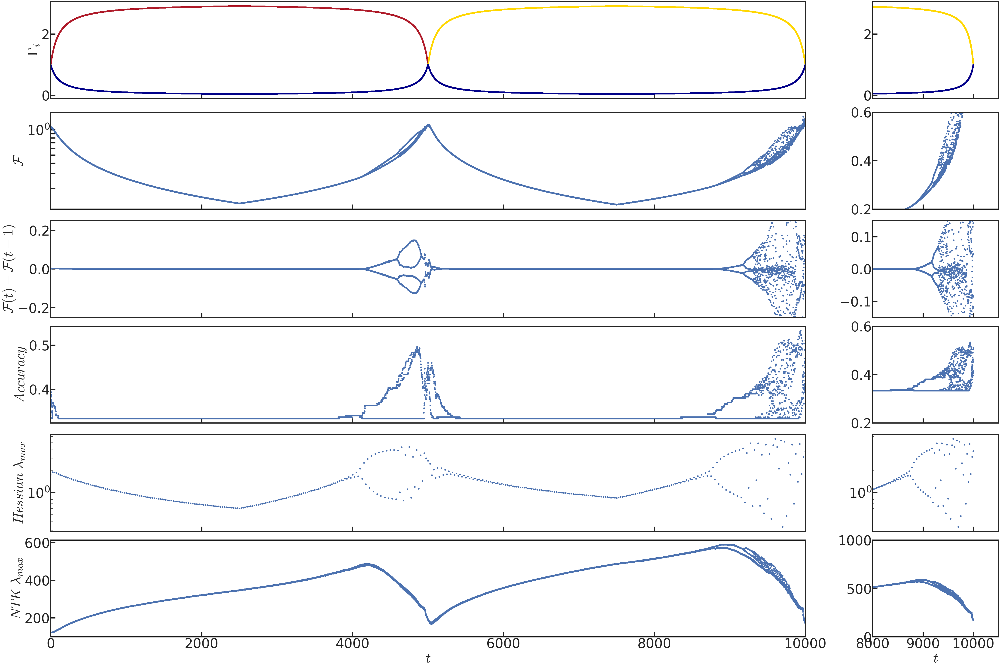


 time:  10025

 time:  10050

 time:  10075

 time:  10100

 time:  10125

 time:  10150

 time:  10175

 time:  10200

 time:  10225

 time:  10250

 time:  10275

 time:  10300

 time:  10325

 time:  10350

 time:  10375

 time:  10400

 time:  10425

 time:  10450

 time:  10475

 time:  10500

 time:  10525

 time:  10550

 time:  10575

 time:  10600

 time:  10625

 time:  10650

 time:  10675

 time:  10700

 time:  10725

 time:  10750

 time:  10775

 time:  10800

 time:  10825

 time:  10850

 time:  10875

 time:  10900

 time:  10925

 time:  10950

 time:  10975

 time:  11000

 time:  11025

 time:  11050

 time:  11075

 time:  11100

 time:  11125

 time:  11150

 time:  11175

 time:  11200

 time:  11225

 time:  11250

 time:  11275

 time:  11300

 time:  11325

 time:  11350

 time:  11375

 time:  11400

 time:  11425

 time:  11450

 time:  11475

 time:  11500

 time:  11525

 time:  11550

 time:  11575

 time:  11600

 time:  11625

 time:  11650

 time:  1

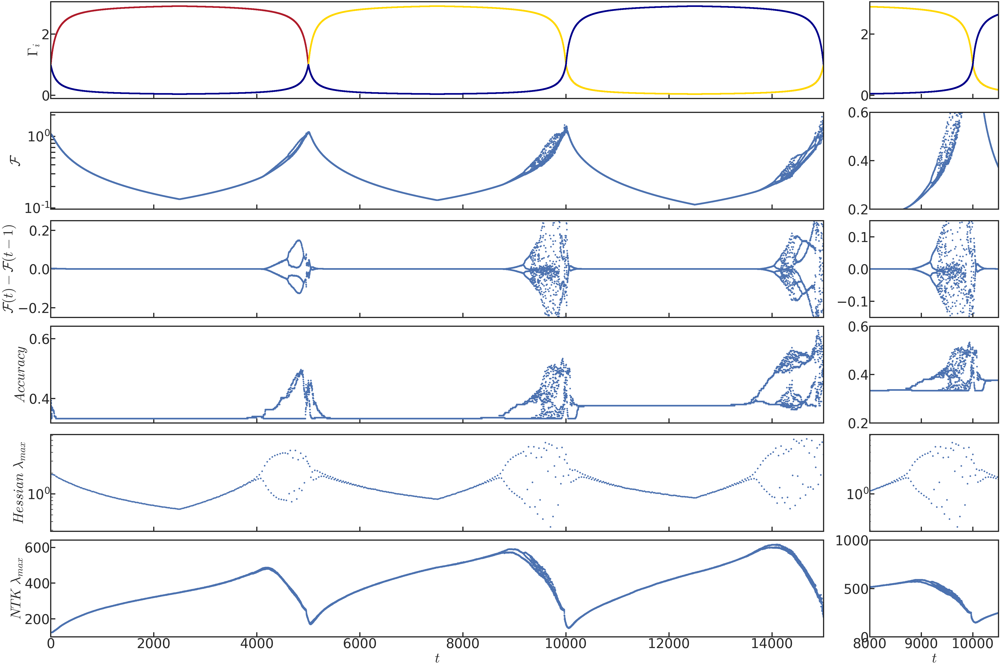


 time:  15025

 time:  15050

 time:  15075

 time:  15100

 time:  15125

 time:  15150

 time:  15175

 time:  15200

 time:  15225

 time:  15250

 time:  15275

 time:  15300

 time:  15325

 time:  15350

 time:  15375

 time:  15400

 time:  15425

 time:  15450

 time:  15475

 time:  15500

 time:  15525

 time:  15550

 time:  15575

 time:  15600

 time:  15625

 time:  15650

 time:  15675

 time:  15700

 time:  15725

 time:  15750

 time:  15775

 time:  15800

 time:  15825

 time:  15850

 time:  15875

 time:  15900

 time:  15925

 time:  15950

 time:  15975

 time:  16000

 time:  16025

 time:  16050

 time:  16075

 time:  16100

 time:  16125

 time:  16150

 time:  16175

 time:  16200

 time:  16225

 time:  16250

 time:  16275

 time:  16300

 time:  16325

 time:  16350

 time:  16375

 time:  16400

 time:  16425

 time:  16450

 time:  16475

 time:  16500

 time:  16525

 time:  16550

 time:  16575

 time:  16600

 time:  16625

 time:  16650

 time:  1

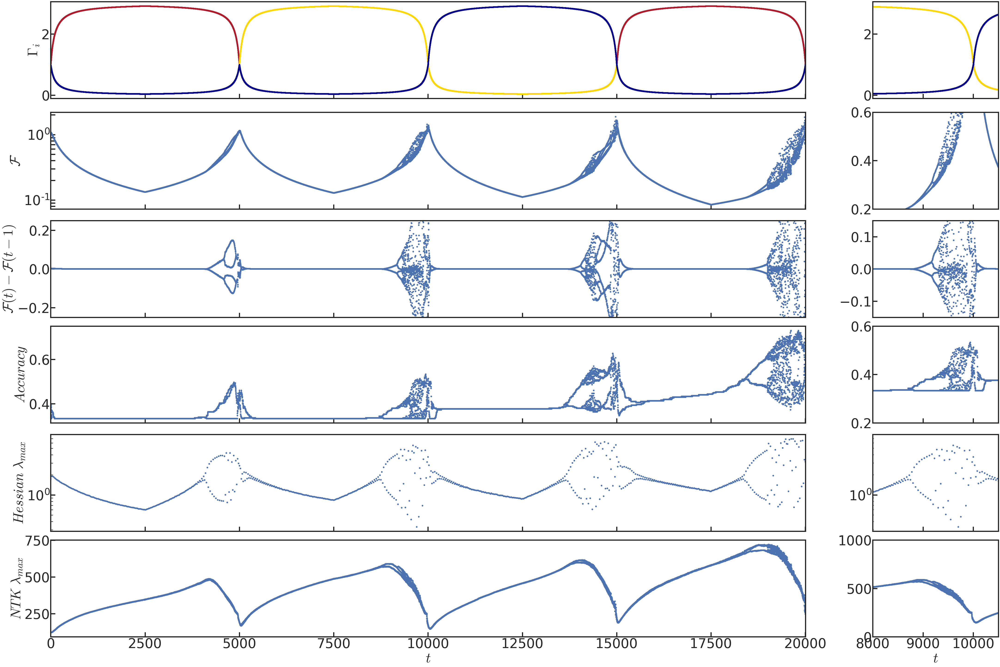


 time:  20025

 time:  20050

 time:  20075

 time:  20100

 time:  20125

 time:  20150

 time:  20175

 time:  20200

 time:  20225

 time:  20250

 time:  20275

 time:  20300

 time:  20325

 time:  20350

 time:  20375

 time:  20400

 time:  20425

 time:  20450

 time:  20475

 time:  20500

 time:  20525

 time:  20550

 time:  20575

 time:  20600

 time:  20625

 time:  20650

 time:  20675

 time:  20700

 time:  20725

 time:  20750

 time:  20775

 time:  20800

 time:  20825

 time:  20850

 time:  20875

 time:  20900

 time:  20925

 time:  20950

 time:  20975

 time:  21000

 time:  21025

 time:  21050

 time:  21075

 time:  21100

 time:  21125

 time:  21150

 time:  21175

 time:  21200

 time:  21225

 time:  21250

 time:  21275

 time:  21300

 time:  21325

 time:  21350

 time:  21375

 time:  21400

 time:  21425

 time:  21450

 time:  21475

 time:  21500

 time:  21525

 time:  21550

 time:  21575

 time:  21600

 time:  21625

 time:  21650

 time:  2

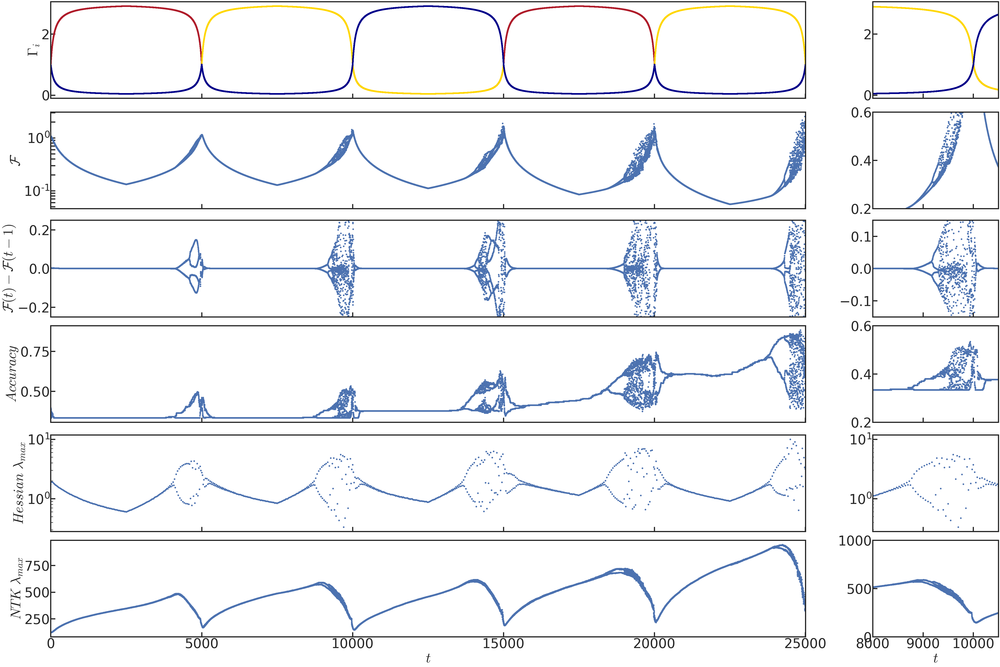


 time:  25025

 time:  25050

 time:  25075

 time:  25100

 time:  25125

 time:  25150

 time:  25175

 time:  25200

 time:  25225

 time:  25250

 time:  25275

 time:  25300

 time:  25325

 time:  25350

 time:  25375

 time:  25400

 time:  25425

 time:  25450

 time:  25475

 time:  25500

 time:  25525

 time:  25550

 time:  25575

 time:  25600

 time:  25625

 time:  25650

 time:  25675

 time:  25700

 time:  25725

 time:  25750

 time:  25775

 time:  25800

 time:  25825

 time:  25850

 time:  25875

 time:  25900

 time:  25925

 time:  25950

 time:  25975

 time:  26000

 time:  26025

 time:  26050

 time:  26075

 time:  26100

 time:  26125

 time:  26150

 time:  26175

 time:  26200

 time:  26225

 time:  26250

 time:  26275

 time:  26300

 time:  26325

 time:  26350

 time:  26375

 time:  26400

 time:  26425

 time:  26450

 time:  26475

 time:  26500

 time:  26525

 time:  26550

 time:  26575

 time:  26600

 time:  26625

 time:  26650

 time:  2

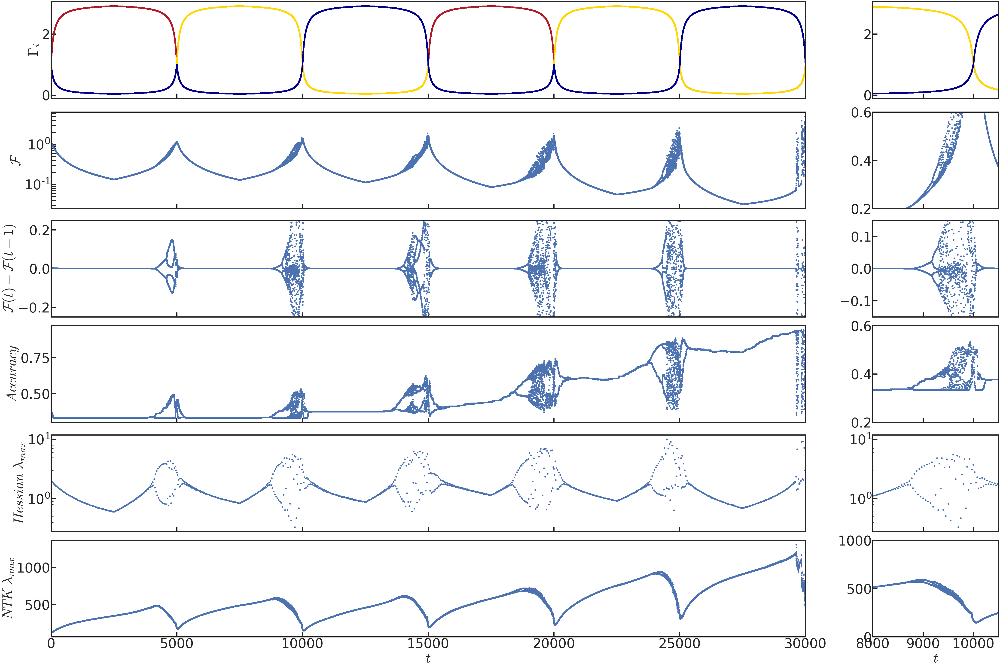


 time:  30025

 time:  30050

 time:  30075

 time:  30100

 time:  30125

 time:  30150

 time:  30175

 time:  30200

 time:  30225

 time:  30250

 time:  30275

 time:  30300

 time:  30325

 time:  30350

 time:  30375

 time:  30400

 time:  30425

 time:  30450

 time:  30475

 time:  30500

 time:  30525

 time:  30550

 time:  30575

 time:  30600

 time:  30625

 time:  30650

 time:  30675

 time:  30700

 time:  30725

 time:  30750

 time:  30775

 time:  30800

 time:  30825

 time:  30850

 time:  30875

 time:  30900

 time:  30925

 time:  30950

 time:  30975

 time:  31000

 time:  31025

 time:  31050

 time:  31075

 time:  31100

 time:  31125

 time:  31150

 time:  31175

 time:  31200

 time:  31225

 time:  31250

 time:  31275

 time:  31300

 time:  31325

 time:  31350

 time:  31375

 time:  31400

 time:  31425

 time:  31450

 time:  31475

 time:  31500

 time:  31525

 time:  31550

 time:  31575

 time:  31600

 time:  31625

 time:  31650

 time:  3

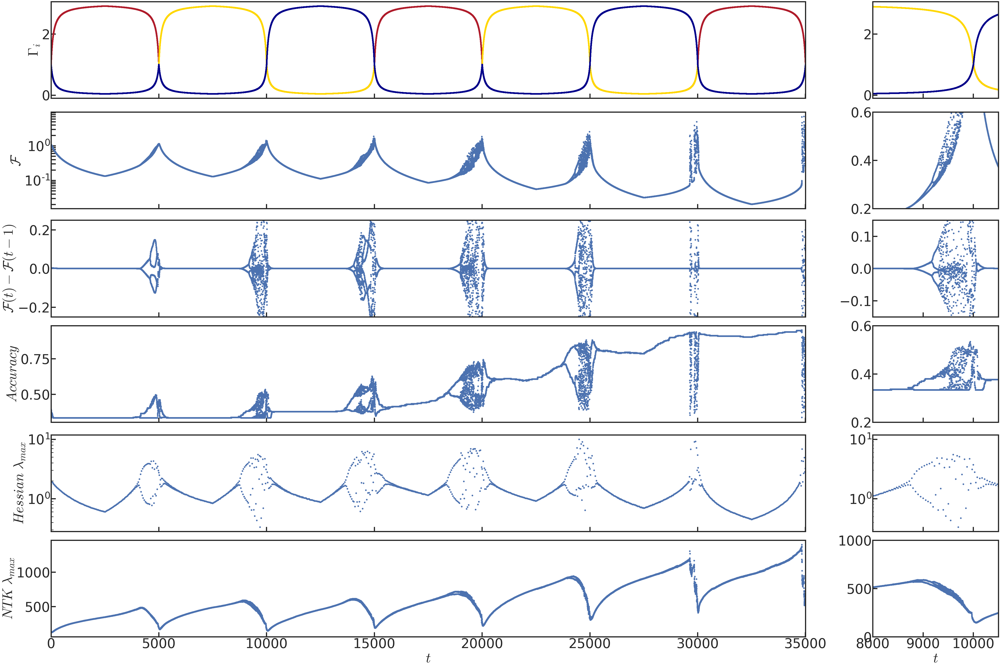


 time:  35025

 time:  35050

 time:  35075

 time:  35100

 time:  35125

 time:  35150

 time:  35175

 time:  35200

 time:  35225

 time:  35250

 time:  35275

 time:  35300

 time:  35325

 time:  35350

 time:  35375

 time:  35400

 time:  35425

 time:  35450

 time:  35475

 time:  35500

 time:  35525

 time:  35550

 time:  35575

 time:  35600

 time:  35625

 time:  35650

 time:  35675

 time:  35700

 time:  35725

 time:  35750

 time:  35775

 time:  35800

 time:  35825

 time:  35850

 time:  35875

 time:  35900

 time:  35925

 time:  35950

 time:  35975

 time:  36000

 time:  36025

 time:  36050

 time:  36075

 time:  36100

 time:  36125

 time:  36150

 time:  36175

 time:  36200

 time:  36225

 time:  36250

 time:  36275

 time:  36300

 time:  36325

 time:  36350

 time:  36375

 time:  36400

 time:  36425

 time:  36450

 time:  36475

 time:  36500

 time:  36525

 time:  36550

 time:  36575

 time:  36600

 time:  36625

 time:  36650

 time:  3

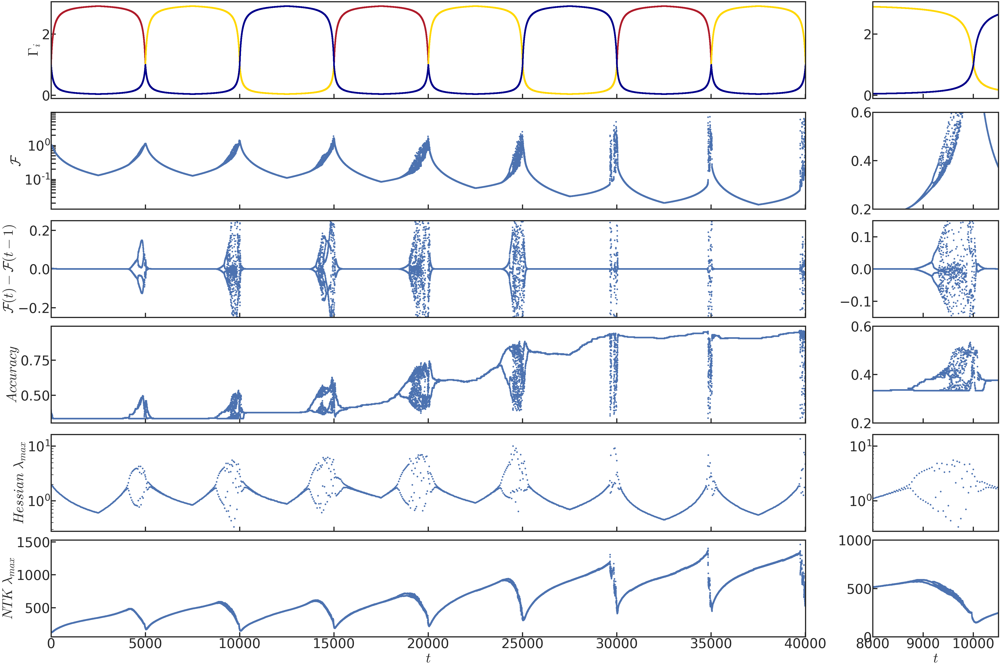


 time:  40025

 time:  40050

 time:  40075

 time:  40100

 time:  40125

 time:  40150

 time:  40175

 time:  40200

 time:  40225

 time:  40250

 time:  40275

 time:  40300

 time:  40325

 time:  40350

 time:  40375

 time:  40400

 time:  40425

 time:  40450

 time:  40475

 time:  40500

 time:  40525

 time:  40550

 time:  40575

 time:  40600

 time:  40625

 time:  40650

 time:  40675

 time:  40700

 time:  40725

 time:  40750

 time:  40775

 time:  40800

 time:  40825

 time:  40850

 time:  40875

 time:  40900

 time:  40925

 time:  40950

 time:  40975

 time:  41000

 time:  41025

 time:  41050

 time:  41075

 time:  41100

 time:  41125

 time:  41150

 time:  41175

 time:  41200

 time:  41225

 time:  41250

 time:  41275

 time:  41300

 time:  41325

 time:  41350

 time:  41375

 time:  41400

 time:  41425

 time:  41450

 time:  41475

 time:  41500

 time:  41525

 time:  41550

 time:  41575

 time:  41600

 time:  41625

 time:  41650

 time:  4

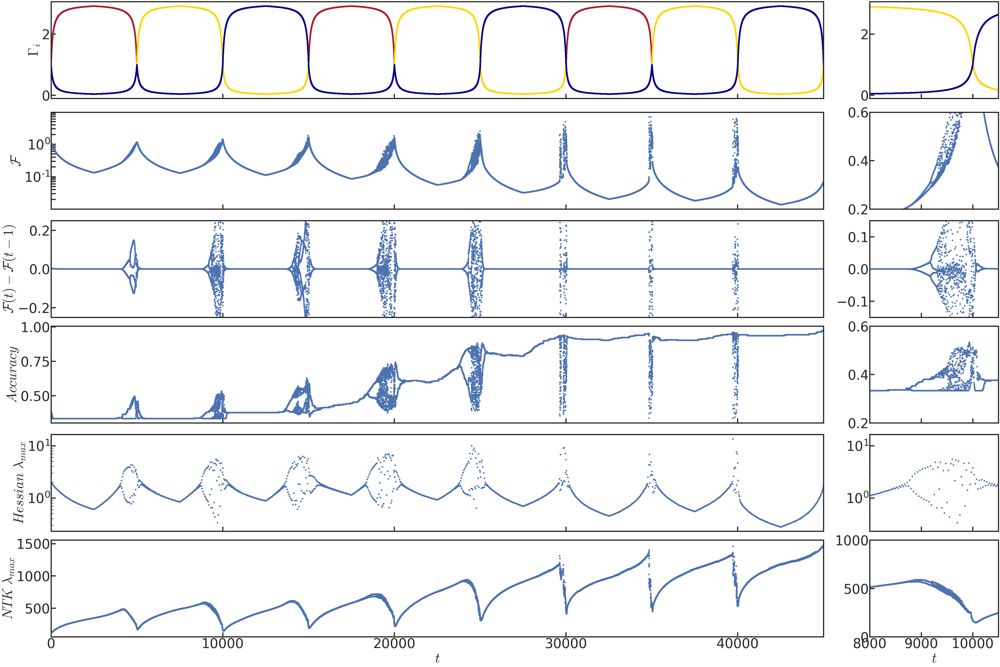


 time:  45025

 time:  45050

 time:  45075

 time:  45100

 time:  45125

 time:  45150

 time:  45175

 time:  45200

 time:  45225

 time:  45250

 time:  45275

 time:  45300

 time:  45325

 time:  45350

 time:  45375

 time:  45400

 time:  45425

 time:  45450

 time:  45475

 time:  45500

 time:  45525

 time:  45550

 time:  45575

 time:  45600

 time:  45625

 time:  45650

 time:  45675

 time:  45700

 time:  45725

 time:  45750

 time:  45775

 time:  45800

 time:  45825

 time:  45850

 time:  45875

 time:  45900

 time:  45925

 time:  45950

 time:  45975

 time:  46000

 time:  46025

 time:  46050

 time:  46075

 time:  46100

 time:  46125

 time:  46150

 time:  46175

 time:  46200

 time:  46225

 time:  46250

 time:  46275

 time:  46300

 time:  46325

 time:  46350

 time:  46375

 time:  46400

 time:  46425

 time:  46450

 time:  46475

 time:  46500

 time:  46525

 time:  46550

 time:  46575

 time:  46600

 time:  46625

 time:  46650

 time:  4

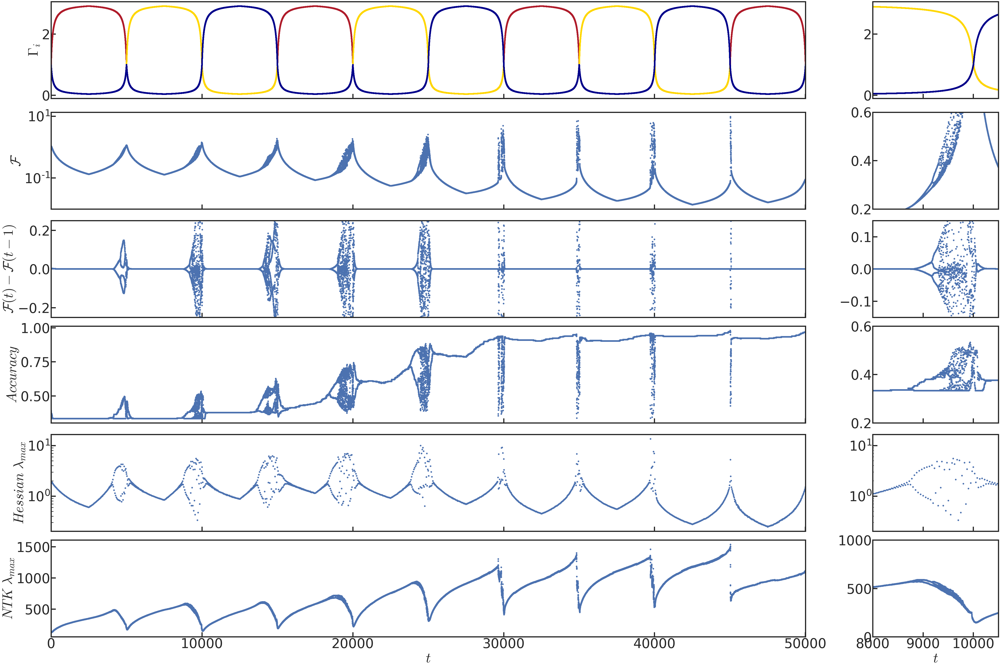


 time:  50025

 time:  50050

 time:  50075

 time:  50100

 time:  50125

 time:  50150

 time:  50175

 time:  50200

 time:  50225

 time:  50250

 time:  50275

 time:  50300

 time:  50325

 time:  50350

 time:  50375

 time:  50400

 time:  50425

 time:  50450

 time:  50475

 time:  50500

 time:  50525

 time:  50550

 time:  50575

 time:  50600

 time:  50625

 time:  50650

 time:  50675

 time:  50700

 time:  50725

 time:  50750

 time:  50775

 time:  50800

 time:  50825

 time:  50850

 time:  50875

 time:  50900

 time:  50925

 time:  50950

 time:  50975

 time:  51000

 time:  51025

 time:  51050

 time:  51075

 time:  51100

 time:  51125

 time:  51150

 time:  51175

 time:  51200

 time:  51225

 time:  51250

 time:  51275

 time:  51300

 time:  51325

 time:  51350

 time:  51375

 time:  51400

 time:  51425

 time:  51450

 time:  51475

 time:  51500

 time:  51525

 time:  51550

 time:  51575

 time:  51600

 time:  51625

 time:  51650

 time:  5

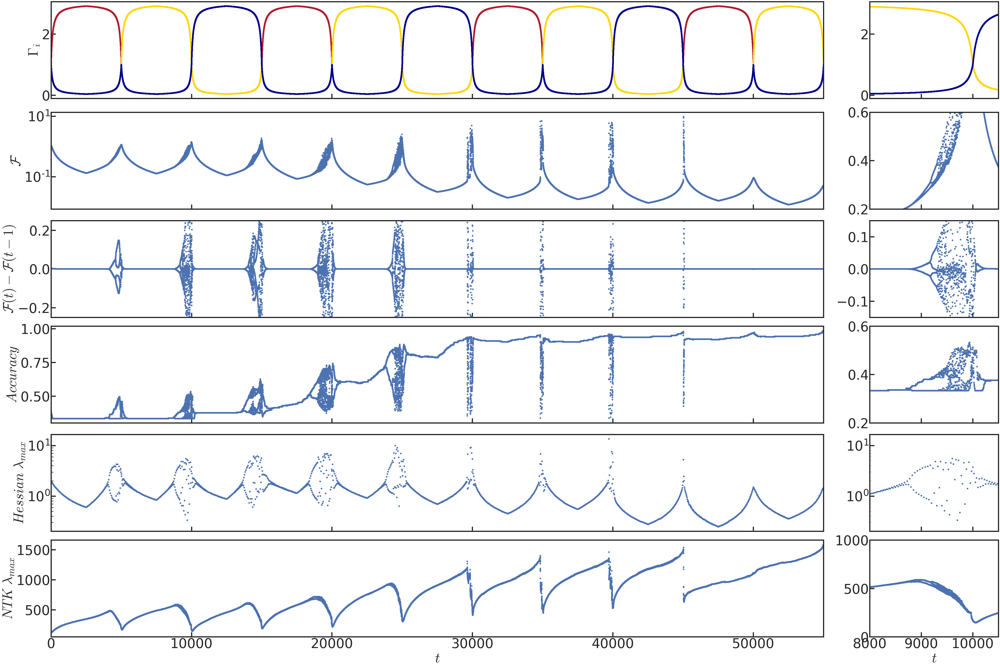


 time:  55025

 time:  55050

 time:  55075

 time:  55100

 time:  55125

 time:  55150

 time:  55175

 time:  55200

 time:  55225

 time:  55250

 time:  55275

 time:  55300

 time:  55325

 time:  55350

 time:  55375

 time:  55400

 time:  55425

 time:  55450

 time:  55475

 time:  55500

 time:  55525

 time:  55550

 time:  55575

 time:  55600

 time:  55625

 time:  55650

 time:  55675

 time:  55700

 time:  55725

 time:  55750

 time:  55775

 time:  55800

 time:  55825

 time:  55850

 time:  55875

 time:  55900

 time:  55925

 time:  55950

 time:  55975

 time:  56000

 time:  56025

 time:  56050

 time:  56075

 time:  56100

 time:  56125

 time:  56150

 time:  56175

 time:  56200

 time:  56225

 time:  56250

 time:  56275

 time:  56300

 time:  56325

 time:  56350

 time:  56375

 time:  56400

 time:  56425

 time:  56450

 time:  56475

 time:  56500

 time:  56525

 time:  56550

 time:  56575

 time:  56600

 time:  56625

 time:  56650

 time:  5

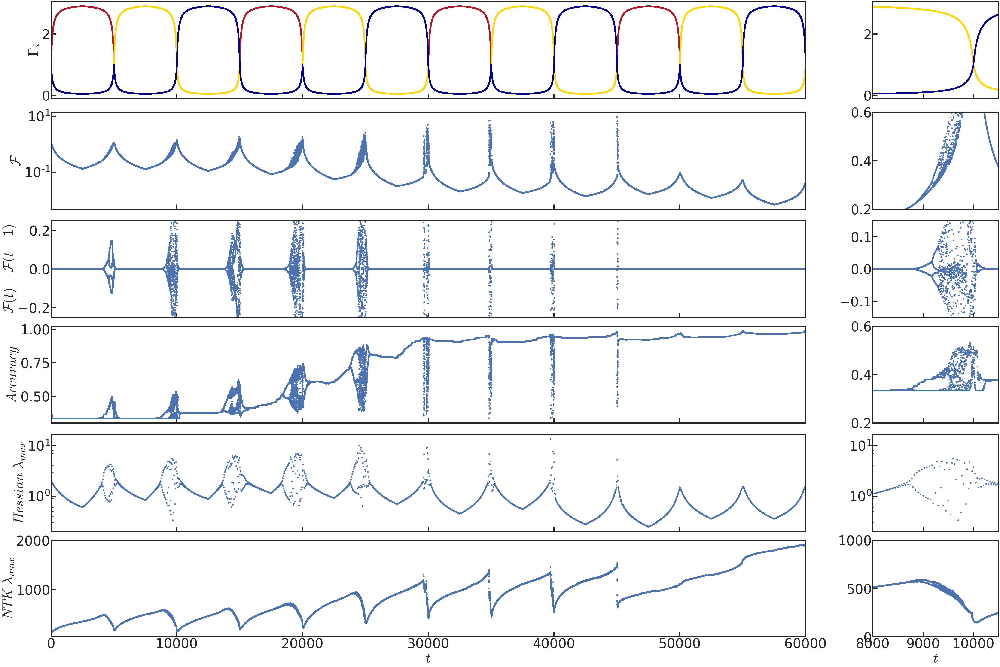


 time:  60025

 time:  60050

 time:  60075

 time:  60100

 time:  60125

 time:  60150

 time:  60175

 time:  60200

 time:  60225

 time:  60250

 time:  60275

 time:  60300

 time:  60325

 time:  60350

 time:  60375

 time:  60400

 time:  60425

 time:  60450

 time:  60475

 time:  60500

 time:  60525

 time:  60550

 time:  60575

 time:  60600

 time:  60625

 time:  60650

 time:  60675

 time:  60700

 time:  60725

 time:  60750

 time:  60775

 time:  60800

 time:  60825

 time:  60850

 time:  60875

 time:  60900

 time:  60925

 time:  60950

 time:  60975

 time:  61000

 time:  61025

 time:  61050

 time:  61075

 time:  61100

 time:  61125

 time:  61150

 time:  61175

 time:  61200

 time:  61225

 time:  61250

 time:  61275

 time:  61300

 time:  61325

 time:  61350

 time:  61375

 time:  61400

 time:  61425

 time:  61450

 time:  61475

 time:  61500

 time:  61525

 time:  61550

 time:  61575

 time:  61600

 time:  61625

 time:  61650

 time:  6

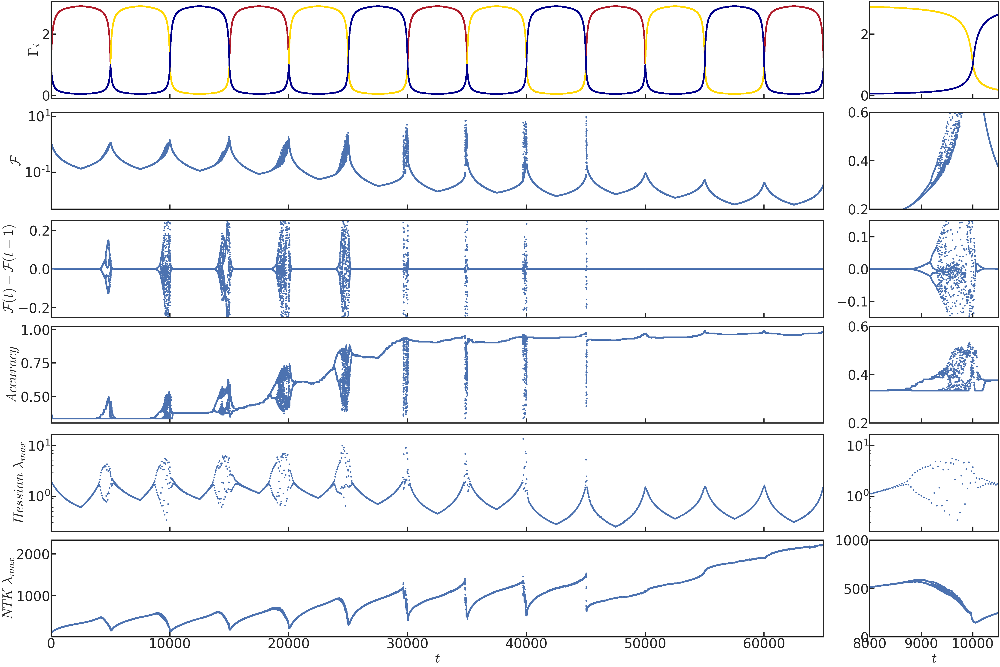


 time:  65025

 time:  65050

 time:  65075

 time:  65100

 time:  65125

 time:  65150

 time:  65175

 time:  65200

 time:  65225

 time:  65250

 time:  65275

 time:  65300

 time:  65325

 time:  65350

 time:  65375

 time:  65400

 time:  65425

 time:  65450

 time:  65475

 time:  65500

 time:  65525

 time:  65550

 time:  65575

 time:  65600

 time:  65625

 time:  65650

 time:  65675

 time:  65700

 time:  65725

 time:  65750

 time:  65775

 time:  65800

 time:  65825

 time:  65850

 time:  65875

 time:  65900

 time:  65925

 time:  65950

 time:  65975

 time:  66000

 time:  66025

 time:  66050

 time:  66075

 time:  66100

 time:  66125

 time:  66150

 time:  66175

 time:  66200

 time:  66225

 time:  66250

 time:  66275

 time:  66300

 time:  66325

 time:  66350

 time:  66375

 time:  66400

 time:  66425

 time:  66450

 time:  66475

 time:  66500

 time:  66525

 time:  66550

 time:  66575

 time:  66600

 time:  66625

 time:  66650

 time:  6

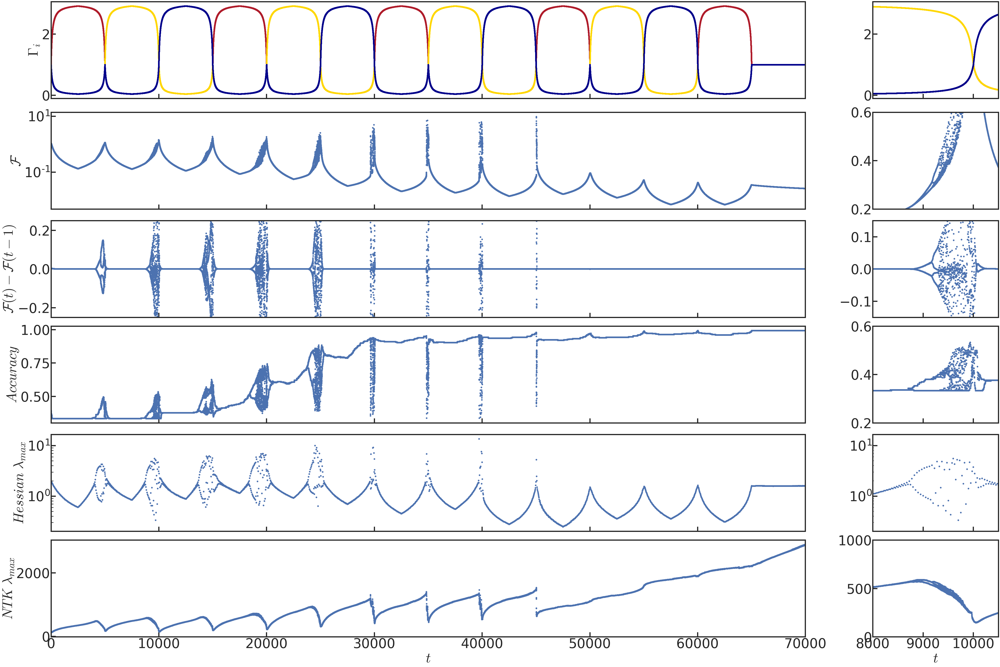

In [ ]:

# Creating the dataset
def make_dataset(points_per_class, classes, revolutions=4):
  np.random.seed(0)

  N = points_per_class
  C = classes
  pi = np.pi

  X = np.zeros((N * C, 2))
  y = np.zeros((N * C, C))

  for j in range(C):
    ix = range(N * j, N * (j + 1))
    r = np.linspace(0., 1, N) # radius
    omega = 2 * pi / C
    theta_max = revolutions * pi
    t = np.linspace(omega * j,omega * j + theta_max, N) + np.random.randn(N) * 0.2 # theta
    X[ix] = np.c_[r*np.cos(t), r*np.sin(t)]
    y[ix, j] = 1

  return jax.device_put(X), jax.device_put(y)

X, Y = make_dataset(points_per_class=N, classes=C)

### Defining the Neural Network ###

init_fn, apply_fn, kernel_fn = stax.serial(
                                           stax.Dense(NN_width, parameterization='standard'), 
                                           stax.Relu(), 
                                           stax.Dense(3, parameterization='standard')
                                           )

key = random.PRNGKey(0)

# NTK computation
ntk_fn = jit(nt.empirical_ntk_fn(apply_fn))
@jit
def ntk_evals(params, X):
  ntk = ntk_fn(X, X, params)
  evals, _ = jnp.linalg.eigh(ntk)
  return evals

# Weights for the loss function
def c_fn(t,i,w_max):
  slope = 2 * (w_max - 1) / T 
  w_main_class = jnp.where(t < T / 2., 1+ t * slope, 2 * w_max - t * slope - 1)
  res = jnp.ones(C) +  (w_main_class-1) * jnp.eye(C)[i]
  res = res / jnp.sum(res) * C
  return res

# Dynamical loss function
@jit
def weighted_loss(params, X, Y, t, i,w_max):
  w = c_fn(t,i,w_max)
  return -jnp.mean(jax.nn.log_softmax(apply_fn(params, X)) * Y * w) * C

# Standard loss function
@jit
def loss(params, X, Y):
  return -jnp.mean(jax.nn.log_softmax(apply_fn(params, X)) * Y) * C

# Accuracy
@jit
def accuracy(params, X, Y):
  return jnp.mean(jnp.argmax(apply_fn(params, X), axis=1) == jnp.argmax(Y, axis=1))

# Function that takes one minimization step
@jit
def step_CE(_, t_and_params_and_c):
  t, params, c, w_max = t_and_params_and_c
  g = grad(weighted_loss)(params, X, Y, t, c, w_max)
  return t + 1, tree_multimap(lambda x, dx: x - learning_rate * dx, params, g), c, w_max


### CODE TO COMPUTE THE EIGENVALUES OF THE HESSIAN USING THE LANCZOS ALGORITHM IN JAX ###
### this part of the code has been copied and modified from code by Justin Gilmer (https://github.com/google/spectral-density) ###

num_train = X.shape[0]
num_complete_batches, leftover = divmod(num_train, num_train)
num_batches = num_complete_batches + bool(leftover)

print('num_train,num_complete_batches, leftover,num_batches,bool(leftover)',num_train,num_complete_batches, leftover,num_batches,bool(leftover))

batch_size = np.shape(X)[0]
print('batch_size',batch_size)

def data_stream():
  rng = npr.RandomState(0)
  while True:
    perm = rng.permutation(num_train)
    for i in range(num_batches):
      batch_idx = perm[i * batch_size:(i + 1) * batch_size]
      yield X[batch_idx], Y[batch_idx]

batches = data_stream()

batches_list = [next(batches) for i in range(num_batches)]
def batches_fn():
  for b in batches_list:
    yield b

  
def compute_density_eigenvalues(params,batches_fn,t,class_w,weight,i):
    
  loss_hvp = lambda params, batch: weighted_loss(params, batch[0], batch[1], t, class_w, weight)

  hvp, unravel, num_params = hessian_computation.get_hvp_fn(loss_hvp, params, batches_fn)
  hvp_cl = lambda v: hvp(params, v) / len(batches_list) # Match the API required by lanczos_alg

  rng = random.PRNGKey(0)
  rng, split = random.split(rng)
  tridiag, vecs = lanczos.lanczos_alg(hvp_cl, num_params, order, split)

  eig_vals, all_weights = density_lib.tridiag_to_eigv([tridiag])

  density, grids = density_lib.eigv_to_density(eig_vals, all_weights,
                                  grid_len=10000,
                                  sigma_squared=1e-5)

  return density, grids, eig_vals


#######################
### TRAINING THE NN ###
#######################

w_max_list = [70] # A. It must be >= 1

for w_max in w_max_list:

  ind = 0

  print('\n ', 'NEW SIMULATION A: ', w_max, '\n ')

  L = []
  L_weighted = []
  A = []
  W = []
  NTK_EVALS = []
  eigv_list = []
  eigv_plot_times = []

  if start_osc_from_the_middle:
    t = T // 2 
  else:
    t = 0

  c = 0

  ## NN initialization
  _, params = init_fn(key, X.shape)

  w_max_saved = w_max
  told = time.time()
  
  # Loop of minimization steps
  for i in range(total_time):

    if w_max <1:
      sys.exit('w_max must be >= 1')

    t, params, c, w_max = step_CE(0, (t, params, c, w_max)) 

    if t > T:
      # NEW CYCLE
      tnew = time.time()
      print('Period ',int(i%T) ,' finished. Time steps: ',t,' Computation time: ',tnew-told)
      told = tnew

      t = 0
      c = (c + 1) % 3

      if last_period_no_osc:
        if i>total_time-T:
          print('last period without oscillations')
          w_max = 1

      #Plot
      plot_all_together_5(density, grids, NTK_EVALS, W, L, L_weighted, A, eigv_list_a, eigv_plot_times, limx_2_t = i, limx_1 = 1.6*T, limx_2 = 2.1*T)

    L += [loss(params, X, Y)]
    A += [accuracy(params, X, Y)]
    L_weighted += [weighted_loss(params, X, Y, t, c,w_max)]
    W += [c_fn(t,c,w_max)]
    NTK_EVALS += [ntk_evals(params, X[:50])]

    if i%time_comp_density == 0:
      # Compute eigenvalues of the Hessian
      print('\n time: ', i)
      density, grids, eigvs = compute_density_eigenvalues(params,batches_fn,t,c,w_max, i)
      eigv_list += [[eigvs[0][-1],eigvs[0][-2],eigvs[0][-3]]]
      eigv_list_a = np.array(eigv_list)
      eigv_plot_times += [i]
      ind = ind + 1

  plot_all_together_5(density, grids, NTK_EVALS, W, L, L_weighted, A, eigv_list_a, eigv_plot_times, limx_2_t = total_time, limx_1 = 1.6*T, limx_2 = 2.1*T)
